<a href="https://colab.research.google.com/github/duonghiepit/spotify-hit-prediction/blob/main/Spotify_Data_Analysis_And_Hit_Prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Spotify Data Analysis And Hit Predictio**

Want to jam to a song? Head to Spotify!!!
One of the most popular streaming services is Spotify, and listening to music through this service has become customary for many. Spotify generates a huge amount of data that is used to offer useful features. The user can stream playlists by artists, see music history on an artist or track level, or enjoy radio stations based on their mood or location. This huge amount of traffic allows us to use different types of algorithms in order to predict which song will be a hit among all other songs by the same artist.

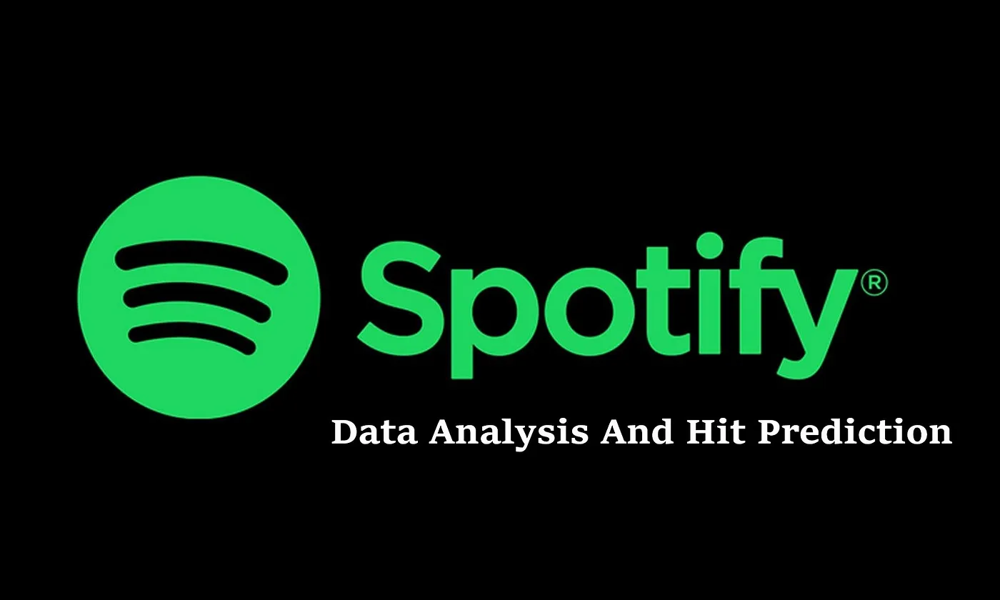

About The Dataset:
So here, we’re going to pick a dataset known as “The Spotify Hit Predictor Dataset (1960–2019)” which contains data on songs from the last six decades. The dataset consists of features for tracks fetched using Spotify’s Web API. The tracks are labeled ‘1’ or ‘0’ (‘Hit’ or ‘Flop’) depending on some criteria of the author. The dataset can be found [here](https://www.kaggle.com/datasets/theoverman/the-spotify-hit-predictor-dataset).

## Import Lib

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
# Models
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import LinearSVC, SVC
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier

In [ ]:
# Reading data
data = [pd.read_csv(f'dataset-of-{decade}0s.csv') for decade in ['6', '7', '8', '9', '0', '1']]

In [ ]:
type(data)

list

In [ ]:
data

[                               track                       artist  \
 0              Jealous Kind Of Fella                Garland Green   
 1                      Initials B.B.             Serge Gainsbourg   
 2                       Melody Twist                  Lord Melody   
 3                      Mi Bomba Sonó                   Celia Cruz   
 4                        Uravu Solla                  P. Susheela   
 ...                              ...                          ...   
 8637                 Le ire di Ursus           Giampiero Boneschi   
 8638                           A-B-C                John Zacherle   
 8639               Useless Landscape         Antônio Carlos Jobim   
 8640               Vendedor De Assaí                     Ary Lobo   
 8641  Mambo Simphony - Remasterizado  Orquesta Casino De La Playa   
 
                                        uri  danceability  energy  key  \
 0     spotify:track:1dtKN6wwlolkM8XZy2y9C1         0.417  0.6200    3   
 1     spo

In [ ]:
for i, decade in enumerate([1960, 1970, 1980, 1990, 2000, 2010]):
    data[i]['decade'] = pd.Series(decade, index=data[i].index)

data = pd.concat(data, axis=0).sample(frac=1.0, random_state=42).reset_index(drop=True)

In [ ]:
data.head()

,track,artist,uri,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,chorus_hit,sections,target,decade
0,Nachtlager N. Granada - The Lower Castle Yard,Traditional,spotify:track:16BjtTPPOnzv83TQWrnQQf,0.530,0.592,10,-16.461,1,0.0366,0.942000,0.93300,0.3930,0.9160,148.098,83400,4,21.26378,6,0,1970
1,How's It Going To Be,Third Eye Blind,spotify:track:3Uvx1TO0Kg5HgGPk58lHXv,0.562,0.593,5,-9.362,1,0.0263,0.003270,0.00139,0.0967,0.5740,80.289,253413,4,22.58257,8,1,1990
2,Heavenly Perverse,Dimmu Borgir,spotify:track:1J1Z0XIL18hClKmm5T5ytO,0.138,0.981,4,-3.797,1,0.1160,0.000016,0.81400,0.0703,0.0399,97.579,392813,3,19.71308,15,0,2000
3,Era um Garoto Que Como Eu Amava os Beatles e o...,Os Incríveis,spotify:track:0mrP69xWBmlnixuVLFqCSl,0.536,0.713,4,-9.203,1,0.0679,0.251000,0.00000,0.9480,0.7720,128.594,209947,4,66.80246,8,0,1970
4,Clavel Sevillano,Javier Solís,spotify:track:15fxd1I7i8BFsZhKwoKANr,0.296,0.462,0,-9.521,1,0.0362,0.782000,0.00000,0.6320,0.4430,141.942,226000,3,36.35407,8,0,1960


## Pandas Proffiling

Pandas Profiling provides a quick and comprehensive EDA of a Pandas DataFrame, which helps in data cleaning, feature engineering, and modeling. Hence, we will generate a pandas profile to obtain a quick analysis of the data:

In [ ]:
!pip install pandas_profiling

In [ ]:
from pandas_profiling import ProfileReport
prof = ProfileReport(data)
prof.to_file(output_file='output.html')

<ipython-input-10-d3d098ccb04f>:1: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  from pandas_profiling import ProfileReport


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
prof

## Exploratory Data Analysis(EDA)

In [ ]:
data.head()

,track,artist,uri,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,chorus_hit,sections,target,decade
0,Nachtlager N. Granada - The Lower Castle Yard,Traditional,spotify:track:16BjtTPPOnzv83TQWrnQQf,0.530,0.592,10,-16.461,1,0.0366,0.942000,0.93300,0.3930,0.9160,148.098,83400,4,21.26378,6,0,1970
1,How's It Going To Be,Third Eye Blind,spotify:track:3Uvx1TO0Kg5HgGPk58lHXv,0.562,0.593,5,-9.362,1,0.0263,0.003270,0.00139,0.0967,0.5740,80.289,253413,4,22.58257,8,1,1990
2,Heavenly Perverse,Dimmu Borgir,spotify:track:1J1Z0XIL18hClKmm5T5ytO,0.138,0.981,4,-3.797,1,0.1160,0.000016,0.81400,0.0703,0.0399,97.579,392813,3,19.71308,15,0,2000
3,Era um Garoto Que Como Eu Amava os Beatles e o...,Os Incríveis,spotify:track:0mrP69xWBmlnixuVLFqCSl,0.536,0.713,4,-9.203,1,0.0679,0.251000,0.00000,0.9480,0.7720,128.594,209947,4,66.80246,8,0,1970
4,Clavel Sevillano,Javier Solís,spotify:track:15fxd1I7i8BFsZhKwoKANr,0.296,0.462,0,-9.521,1,0.0362,0.782000,0.00000,0.6320,0.4430,141.942,226000,3,36.35407,8,0,1960


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41106 entries, 0 to 41105
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   track             41106 non-null  object 
 1   artist            41106 non-null  object 
 2   uri               41106 non-null  object 
 3   danceability      41106 non-null  float64
 4   energy            41106 non-null  float64
 5   key               41106 non-null  int64  
 6   loudness          41106 non-null  float64
 7   mode              41106 non-null  int64  
 8   speechiness       41106 non-null  float64
 9   acousticness      41106 non-null  float64
 10  instrumentalness  41106 non-null  float64
 11  liveness          41106 non-null  float64
 12  valence           41106 non-null  float64
 13  tempo             41106 non-null  float64
 14  duration_ms       41106 non-null  int64  
 15  time_signature    41106 non-null  int64  
 16  chorus_hit        41106 non-null  float6

### Univariate Analysis

Univariate analysis is a statistical method that focuses on studying one variable at a time. It is used to analyze and understand the properties of individual variables in a dataset. The goal of the univariate analysis is to describe the main characteristics of a variable, such as its central tendency, dispersion, and distribution

---

Phân tích đơn biến là một phương pháp thống kê tập trung vào nghiên cứu một biến tại một thời điểm. Nó được sử dụng để phân tích và hiểu các thuộc tính của các biến riêng lẻ trong tập dữ liệu. Mục tiêu của phân tích đơn biến là mô tả các đặc điểm chính của một biến, chẳng hạn như xu hướng trung tâm, độ phân tán và phân phối của nó.

In [ ]:
print(data['target'].value_counts())

0    20553
1    20553
Name: target, dtype: int64


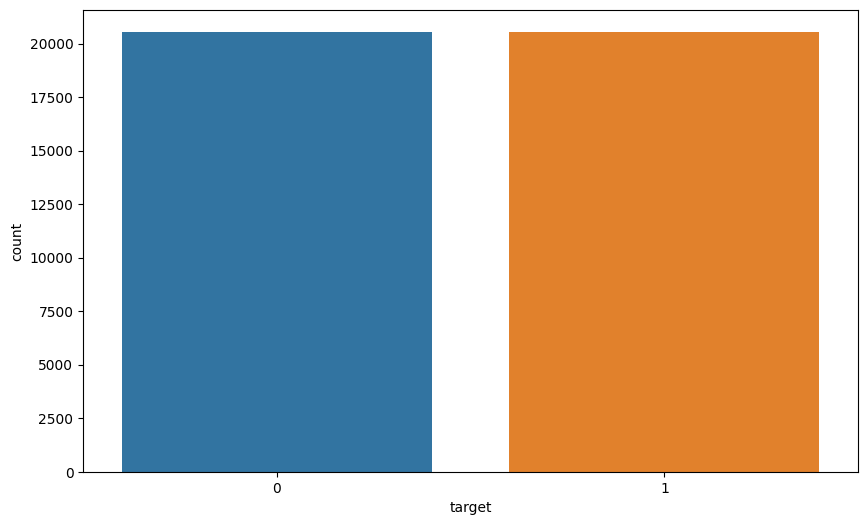

In [ ]:
plt.figure(figsize=[10, 6])
sns.countplot(x='target', data=data)
plt.show()

In [ ]:
prop_1 = data[data['target']==1].shape[0] / data.shape[0]
print(f"Proportion of target values that are 1: {prop_1*100}%")

Proportion of target values that are 1: 50.0%


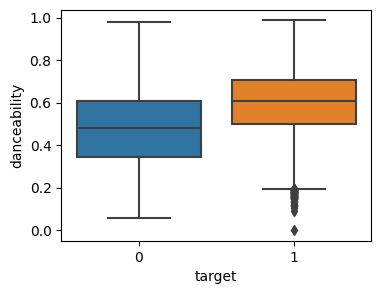

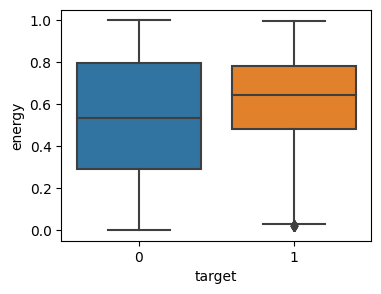

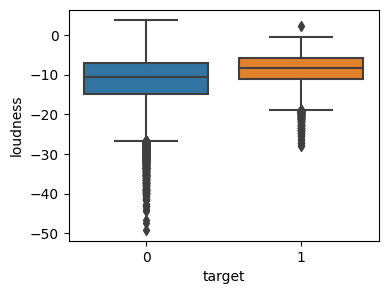

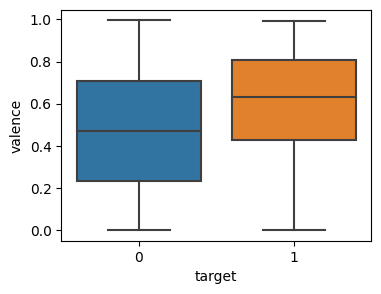

In [ ]:
columns_to_compare = ['danceability', 'energy', 'loudness', 'valence']
for column in columns_to_compare:
    plt.figure(figsize=[4, 3])
    sns.boxplot(x='target', y=column, data=data)
    plt.plot()

You can get similar statistics and analyses for all the variables and plot the data as per requirement. But as we can see, univariate analysis doesn’t reveal much information and we need to compare one variable with one or more than one other variable(s)

---
Bạn có thể nhận được số liệu thống kê và phân tích tương tự cho tất cả các biến và vẽ biểu đồ dữ liệu theo yêu cầu. Nhưng như chúng ta có thể thấy, phân tích đơn biến không tiết lộ nhiều thông tin và chúng ta cần so sánh một biến với một hoặc nhiều biến khác


### Bi/Multi-variate Analysis

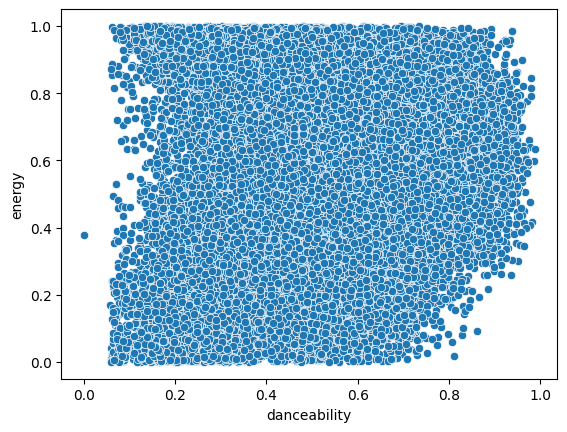

In [ ]:
sns.scatterplot(x='danceability', y='energy', data=data)
plt.show()

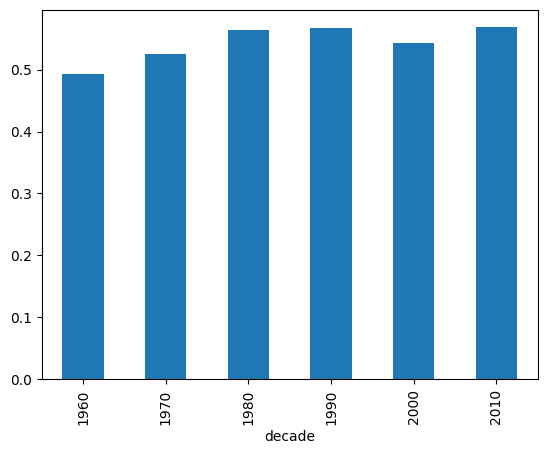

In [ ]:
data.groupby('decade')['danceability'].mean().plot(kind='bar')
plt.show()

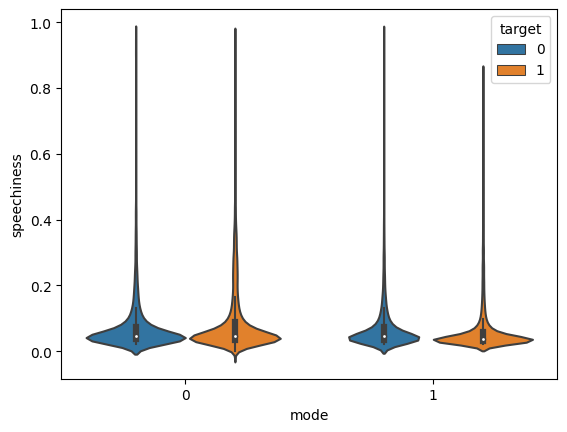

In [ ]:
sns.violinplot(x='mode', y='speechiness', hue='target', data=data)
plt.show()

### What is the average danceability of songs that were hits?

In [ ]:
hit_danceability = data[data['target']==1]['danceability'].mean()
print(f'The average danceability of songs that were hits: {hit_danceability}')

The average danceability of songs that were hits: 0.6012373765387049


### The year with the highest hits?

The year with the highest number of hits: 1960


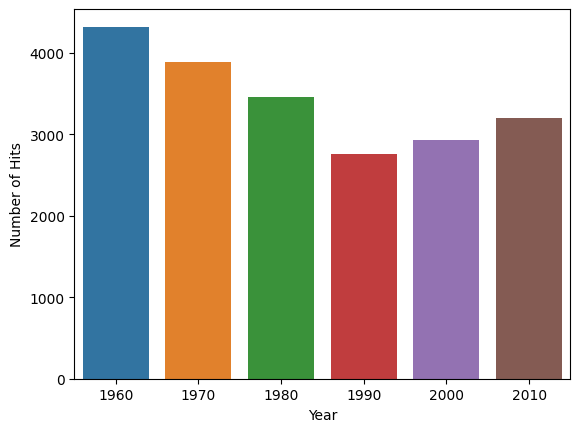

In [ ]:
data['year'] = data['decade'] + (data['decade'] % 10)

data['hit'] = data['target'].apply(lambda x: 1 if x==1 else 0)

yearly_hits = data.groupby('year')['hit'].sum()
year_with_highest_hits = yearly_hits.idxmax()
print(f'The year with the highest number of hits: {year_with_highest_hits}')

sns.barplot(x=yearly_hits.index, y=yearly_hits.values)
plt.xlabel('Year')
plt.ylabel('Number of Hits')
plt.show()

## Data Preprocessing

In [ ]:
data.shape

(41106, 22)

In [ ]:
data.head()

,track,artist,uri,danceability,energy,key,loudness,mode,speechiness,acousticness,...,valence,tempo,duration_ms,time_signature,chorus_hit,sections,target,decade,year,hit
0,Nachtlager N. Granada - The Lower Castle Yard,Traditional,spotify:track:16BjtTPPOnzv83TQWrnQQf,0.530,0.592,10,-16.461,1,0.0366,0.942000,...,0.9160,148.098,83400,4,21.26378,6,0,1970,1970,0
1,How's It Going To Be,Third Eye Blind,spotify:track:3Uvx1TO0Kg5HgGPk58lHXv,0.562,0.593,5,-9.362,1,0.0263,0.003270,...,0.5740,80.289,253413,4,22.58257,8,1,1990,1990,1
2,Heavenly Perverse,Dimmu Borgir,spotify:track:1J1Z0XIL18hClKmm5T5ytO,0.138,0.981,4,-3.797,1,0.1160,0.000016,...,0.0399,97.579,392813,3,19.71308,15,0,2000,2000,0
3,Era um Garoto Que Como Eu Amava os Beatles e o...,Os Incríveis,spotify:track:0mrP69xWBmlnixuVLFqCSl,0.536,0.713,4,-9.203,1,0.0679,0.251000,...,0.7720,128.594,209947,4,66.80246,8,0,1970,1970,0
4,Clavel Sevillano,Javier Solís,spotify:track:15fxd1I7i8BFsZhKwoKANr,0.296,0.462,0,-9.521,1,0.0362,0.782000,...,0.4430,141.942,226000,3,36.35407,8,0,1960,1960,0


In [ ]:
data.drop(['track', 'artist', 'uri'], axis=1, inplace=True)

In [ ]:
data.head()

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,chorus_hit,sections,target,decade,year,hit
0,0.530,0.592,10,-16.461,1,0.0366,0.942000,0.93300,0.3930,0.9160,148.098,83400,4,21.26378,6,0,1970,1970,0
1,0.562,0.593,5,-9.362,1,0.0263,0.003270,0.00139,0.0967,0.5740,80.289,253413,4,22.58257,8,1,1990,1990,1
2,0.138,0.981,4,-3.797,1,0.1160,0.000016,0.81400,0.0703,0.0399,97.579,392813,3,19.71308,15,0,2000,2000,0
3,0.536,0.713,4,-9.203,1,0.0679,0.251000,0.00000,0.9480,0.7720,128.594,209947,4,66.80246,8,0,1970,1970,0
4,0.296,0.462,0,-9.521,1,0.0362,0.782000,0.00000,0.6320,0.4430,141.942,226000,3,36.35407,8,0,1960,1960,0


In [ ]:
y = data['target']
X = data.drop('target', axis=1)

### Splitting the data

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle = True, random_state = 1)

### Scaling the data

In [ ]:
X_train = pd.DataFrame(preprocessing.robust_scale(X_train), index=X_train.index)
X_test = pd.DataFrame(preprocessing.robust_scale(X_test), index=X_test.index)

## Model training

In [ ]:
models = {
    "Logistic Regression": LogisticRegression(),
    "KNN": KNeighborsClassifier(),
    "Decision Tree": DecisionTreeClassifier(),
    "SVM (Linear Kernel)": LinearSVC(),
    "SVM (RBF Kernel)": SVC(),
    "Neural Network": MLPClassifier(),
    "Random Forest": RandomForestClassifier(),
    "Gradient Boosting": GradientBoostingClassifier()
}

for name, model in models.items():
    model.fit(X_train, y_train)
    print(f'{name} trained!')

Logistic Regression trained!
KNN trained!
Decision Tree trained!


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


SVM (Linear Kernel) trained!
SVM (RBF Kernel) trained!
Neural Network trained!
Random Forest trained!
Gradient Boosting trained!


In [ ]:
for name, model in models.items():
    print(f'{name}: {round(model.score(X_test, y_test)*100, 2)}%')

Logistic Regression: 49.84%
KNN: 54.96%
Decision Tree: 49.84%
SVM (Linear Kernel): 49.84%
SVM (RBF Kernel): 49.84%
Neural Network: 49.84%
Random Forest: 49.84%
Gradient Boosting: 49.84%


In [ ]:
clf = RandomForestClassifier()
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)

In [77]:
import joblib
joblib.dump(clf, 'clf.pkl')

['clf.pkl']

## Deploying the model

In [ ]:
!pip install streamlit

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.6/7.6 MB 21.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 190.0/190.0 kB 16.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.8/4.8 MB 39.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.1/82.1 kB 8.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 5.7 MB/s eta 0:00:00


In [ ]:
!streamlit run frontend.py & npx localtunnel --port 8501

[..................] / rollbackFailedOptional: verb npm-session 300e13b09530c8f


  You can now view your Streamlit app in your browser.

  Network URL: http://172.28.0.12:8501
  External URL: http://34.23.195.243:8501

npx: installed 22 in 6.641s
your url is: https://free-rooms-drop.loca.lt
2023-09-26 16:08:29.293 Uncaught app exception
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/streamlit/runtime/scriptrunner/script_runner.py", line 541, in _run_script
    exec(code, module.__dict__)
  File "/content/frontend.py", line 53, in <module>
    if result == 1:
NameError: name 'result' is not defined
